<a href="https://colab.research.google.com/github/maobupa/Text-Analysis-on-HAAA/blob/main/09_24_HAAA_published.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
! pip install wordcloud

In [ ]:
! pip install PyPDF2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 232.6/232.6 kB 8.1 MB/s eta 0:00:00


In [ ]:
! pip install funcy

In [ ]:
from PyPDF2 import PdfReader, PdfFileWriter
import os
import re
import string
import nltk
import pandas as pd
import funcy as fp
from scipy.stats import fisher_exact
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter
import heapq
import csv

In [ ]:
def get_transcription(pdf_filepath):
    """
    read pdf file into strings
    """
    pdf_object = PdfReader(pdf_filepath,strict=False)
    numpages=len(pdf_object.pages)
    c = 0
    transcription = ""
    while c < numpages:
        page = pdf_object.pages[c]
        pt = page.extract_text()
        transcription += "" +pt
        c += 1

    return transcription

def get_context(someterm, somewords, window_size = 20):
    """
    someterm: target term; somewords: list of words
    window size: total number of words you want on either size
    output the words in a window of text around it
    """
    # define half window
    half = int(window_size/2)
    all_context = []
    # enumerate will outout index, object
    for n, w in enumerate(somewords):
        if w == someterm:
            start = max(0, n - half)
            # to ensure the slicing includes 10 after, add 1
            finish = min(n + half + 1, len(somewords) - 1)
            context = somewords[start: finish]
            all_context.append(context)
    return all_context

def get_collocate_counts(somekwics, target_term, excl_target = True):
    """
    input kwics from get_context
    excl_target: whether you want to counttarget_term
    output a dictionary counting all the words in the kwic
    """
    counts = {}
    for i in somekwics:
        for w in i:
            if w not in counts:
                counts[w] = 0
            counts[w] += 1
    if excl_target:
        counts[target_term] -= len(somekwics)
        if counts[target_term] == 0:
            del counts[target_term]
    return counts

def sort_dict(somecountdict, reverse = True):
    """
    input count dictionary
    sort dictionary by values
    output sorted dictionary
    """
    sorted_dict = sorted(somecountdict.items(), key = lambda k: k[1], reverse = reverse)
    return sorted_dict

def file2words(somefilename):
    with open(somefilename) as source:
        text = source.read()
    words = text.split()

    return words

def freqdict(countdict, words):
    """
    input count dictionary and the full list of words
    output frequency dictionary
    """
    fre_dict = {}
    for k, v in countdict.items():
        fre_dict[k] = v/len(words)
    return fre_dict

def get_fishers(someword,somecountdict,someratedict,obs_exp=True,alternative='greater'):
    """
    fisher test for distinctive words and distinctive collocates
    """
    r = someratedict[someword]
    wc = sum(somecountdict.values())
    a = somecountdict[someword]
    b = wc - a
    c = round(r*wc)
    d = wc-c
    p = fisher_exact([[a,b],[c,d]],alternative=alternative)[1]
    if obs_exp == True:
        if c != 0:
            oe = a/c
        else:
            oe = "Inf"
        p = (p,oe)
    return p

def lol2file(somelol,filename,sep=","):
    """
    write lists of lists into file
    """
    with open(filename,'w') as output_file:
        for row in somelol:
            row = [str(i) for i in row]
            ostr = sep.join(row) + "\n"
            output_file.write(ostr)
    print("Wrote the file " + filename)
    return

## Chinese Americans
### The code compare interview transcripts of Chinese Americans and Indian Americans. Therefore, there will be the same process replicated underneath for Indian Americans

#### Input Data
#####Read in data from pdf files. Original pdf is saved in the current directory under a folder named "Data"

In [ ]:
filenames = [file for file in os.listdir("./Data") if file.endswith("pdf")]

#### Data Preprocessing

1.   Get rid of useless words and special symbols.
2.   Tokenization
3. Display in dataframe


In [ ]:
EMAIL_REGEX = re.compile(r"[a-z0-9\.\+_-]+@[a-z0-9\._-]+\.[a-z]*")
FILTER_REGEX = re.compile(r"[^a-z '#]")
PUNCT_REGX = re.compile(r"[\.\?!:\"\']")
TITLE_REGX = re.compile(r"houston asian american archive")
TITLE_REGX2 = re.compile(r"chao center for asian studies")
TITLE_REGX3 = re.compile(r"rice university")
TITLE_REGX4 = re.compile(r"interviewee")
TITLE_REGX5 = re.compile(r"page")
TITLE_REGX6 = re.compile(r"interviewer")
TITLE_REGX7 = re.compile(r"haaa")
TOKEN_MAPPINGS = [(EMAIL_REGEX, "#email"), (FILTER_REGEX, ' '), (PUNCT_REGX, ' '), (TITLE_REGX, ' '), (TITLE_REGX2, ' '), (TITLE_REGX3, ' '), (TITLE_REGX4, ' '), (TITLE_REGX5, ' '), (TITLE_REGX6, ' '), (TITLE_REGX7, ' ')]

def tokenize_line(line):
    res = line.lower()
    for regexp, replacement in TOKEN_MAPPINGS:
        res = regexp.sub(replacement, res)
    return res.split()

def tokenize(lines, token_size_filter=2):
    tokens = fp.mapcat(tokenize_line, lines)
    return [t for t in tokens if len(t) > token_size_filter]


def load_doc(filename):
    doc = get_transcription("./Data/" + filename).split("\n")
    return {'doc': doc,
            'tokens': tokenize(doc),
            'id': filename}


docs = pd.DataFrame(list(map(load_doc, filenames))).set_index(['id'])
docs.head()

,doc,tokens
id,,
Gene Chung.pdf,"[Houston Asian American Archive , Chao Center...","[gene, chung, chung, jing, yau, chris, chan, b..."
Beverly Gor.pdf,"[Houston Asian American Archive , , Chao Cen...","[beverly, gor, maria, maldonado, and, asiya, k..."
Gene Lee.pdf,"[Houston Asian American Archive , Chao Center ...","[gene, lee, tracey, lam, pin, fang, wang, date..."
Faye Chin 2.pdf,[ Houston Asian American Archive Chao Center ...,"[faye, chin, priscilla, xingyi, date, time, in..."
Willy Lo.pdf,[Houston Asian American Archive Chao Center fo...,"[willy, sheryl, mary, llen, date, time, interv..."


#### Collocates


1.   Define a keyword
2.   Search for words surrounding the keywords
3.   Generate wordcloud for data visualization



In [ ]:
def collocate_fre(target_term, docs, filenames):
    """
    input: target_term in string, docs in pandas format, filenames in list
    output: dictionary of total frequency of collocates
    """
    kwic_dict = {}
    check_list = []

    for i in range(len(filenames)):
        word = docs["tokens"][i]
        kwic = get_context(target_term, word)
        check_list.append(kwic)
        if kwic == []:
            kwic_dict[filenames[i]] = "NaN"
        else:
            kwic_counts = get_collocate_counts(kwic, target_term, excl_target = True)
            sorted_kwic_counts = sort_dict(kwic_counts)
            kwic_dict[filenames[i]] = sorted_kwic_counts

    all_count = {}
    for id, dict in kwic_dict.items():
        if dict == "NaN":
            if "NaN" not in all_count:
                all_count[dict] = 0
            all_count[dict] += 1
            continue
        for word_count in dict:
            key = word_count[0]
            value = word_count[1]
            if key not in all_count:
                all_count[key] = 0
            all_count[key] += value

    return all_count, check_list

##### for the first target_term, I will break down the procedure of the collocate_fre function and display the process step by step

In [ ]:
# define target_term
target_term = "home"

In [ ]:
# get context for target_term for all interviews

# create an empty dict
kwic_dict = {}
check_list = []

for i in range(len(filenames)):
    word = docs["tokens"][i]
    kwic = get_context(target_term, word)
    check_list.append(kwic)
    if kwic == []:
        kwic_dict[filenames[i]] = "NaN"
    else:
        kwic_counts = get_collocate_counts(kwic, target_term, excl_target = True)
        sorted_kwic_counts = sort_dict(kwic_counts)
        kwic_dict[filenames[i]] = sorted_kwic_counts

In [ ]:
# all count
all_count = {}
for id, dict in kwic_dict.items():
    if dict == "NaN":
        if "NaN" not in all_count:
            all_count[dict] = 0
        all_count[dict] += 1
        continue
    for word_count in dict:
        key = word_count[0]
        value = word_count[1]
        if key not in all_count:
            all_count[key] = 0
        all_count[key] += value

In [ ]:
# input a list of stopwrds and get rid off those in the collocates search
stop_list = file2words("stopwords.txt")
stop_list.append("like")
stop_list.append("know")
stop_list.append("NaN")

In [ ]:
filter_home_collocate = {k:v for k, v in all_count.items() if k not in stop_list}

In [ ]:
sorted_home_count = sort_dict(filter_home_collocate)

In [ ]:
def col2csv(somedata,filename):
  """
  write out csv table
  """
  with open(filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Word', 'Count'])  # Write the header
    writer.writerows(somedata)
  print("Wrote the file " + filename)
  return

In [ ]:
# Specify a filename for the results
filename = "chinese_collocate_home.csv"
col2csv(sorted_home_count,filename)

Wrote the file chinese_collocate_home.csv


In [ ]:
wc = WordCloud(font_path="timr45w.ttf", background_color="black", width = 1200, height = 1000, max_words=2000, min_font_size = 10, collocations=False, contour_width=3, colormap = 'Pastel1').generate_from_frequencies(filter_home_collocate)

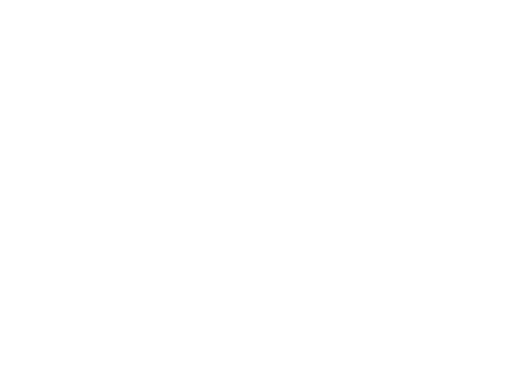

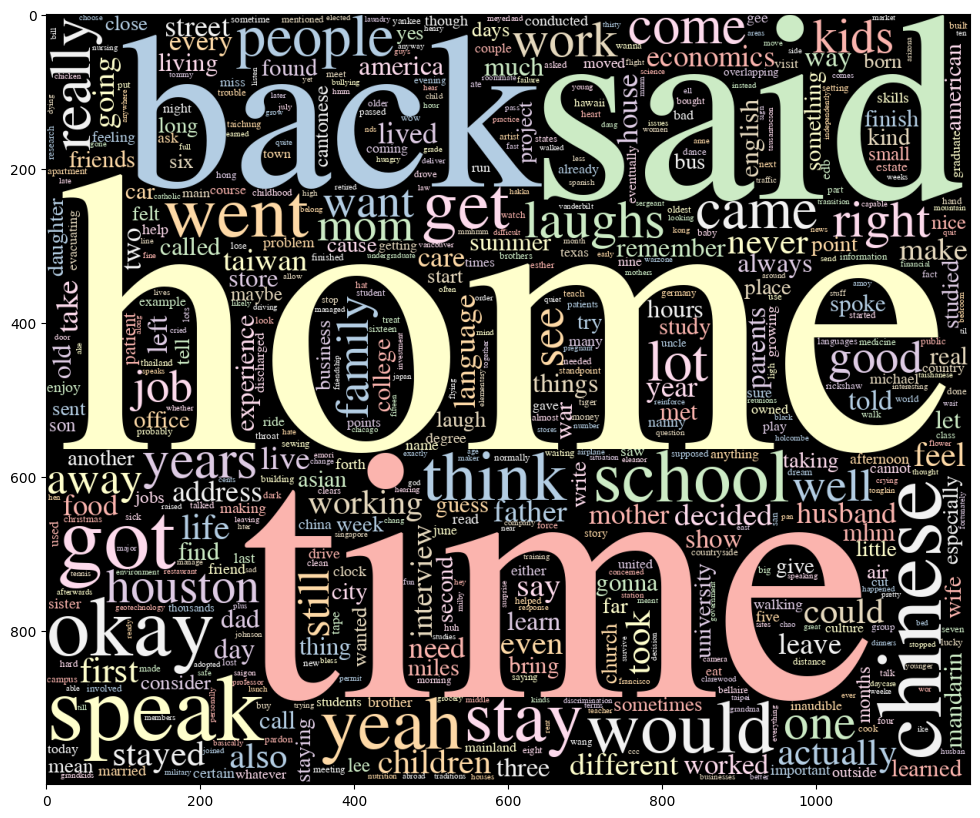

In [ ]:
plt.axis("off")
    # so that the size shown matches our request
plt.figure(figsize=(12,10))
plt.tight_layout()
plt.imshow(wc)

In [ ]:
wc.to_file('chinese_home_collate_v2.png')

In [ ]:
# target_term = china
china_collocate, check_list2 = collocate_fre("china", docs, filenames)
filter_china_collocate = {k:v for k, v in china_collocate.items() if k not in stop_list}

In [ ]:
# count the total number of times "war" appears in the context of this target term china
count2 = 0
war_list = []
for inner_list in check_list2:
    for inner_inner_list in inner_list:
      if "war" in inner_inner_list:
        war_list.append(inner_inner_list)
        count2 += 1
count2

23

In [ ]:
#war_list

In [ ]:
sorted_china_count = sort_dict(filter_china_collocate)

In [ ]:
filename = "chinese_collocate_china.csv"
col2csv(sorted_china_count,filename)

Wrote the file chinese_collocate_china.csv


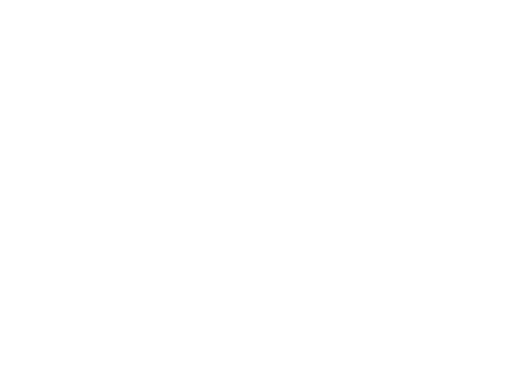

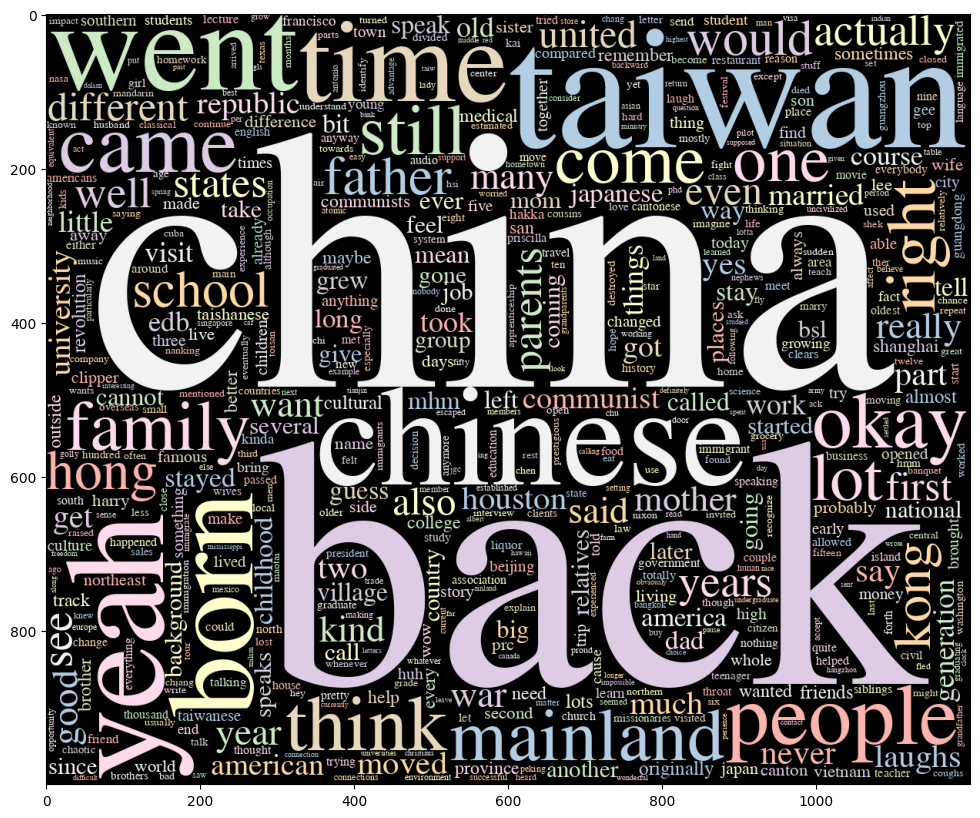

In [ ]:
wc_china = WordCloud(font_path="timr45w.ttf", background_color="black", width = 1200, height = 1000, max_words=2000, min_font_size = 10, collocations=False, contour_width=3, colormap = 'Pastel1').generate_from_frequencies(filter_china_collocate)
plt.axis("off")
    # so that the size shown matches our request
plt.figure(figsize=(12,10))
plt.tight_layout()
plt.imshow(wc_china)

In [ ]:
wc_china.to_file('chinese_china_collate.png')

In [ ]:
# target_term = houston
houston_collocate, check_list3 = collocate_fre("houston", docs, filenames)
filter_houston_collocate = {k:v for k, v in houston_collocate.items() if k not in stop_list}

In [ ]:
filter_houston_collocate["houston"]

338

In [ ]:
sorted_houston_count = sort_dict(filter_houston_collocate)

In [ ]:
# count the total number of context
count3 = 0
for inner_list in check_list3:
    for inner_inner_list in inner_list:
        count3 += 1
count3

1140

In [ ]:
filename = "chinese_collocate_houston.csv"
col2csv(sorted_houston_count,filename)

Wrote the file chinese_collocate_houston.csv


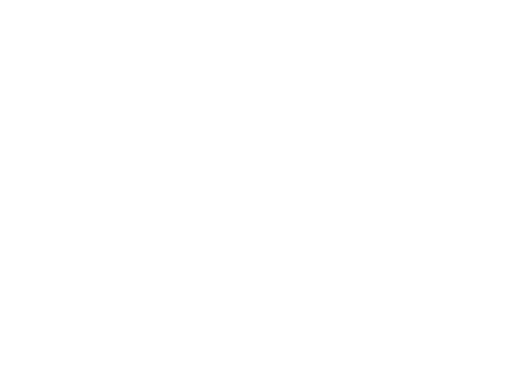

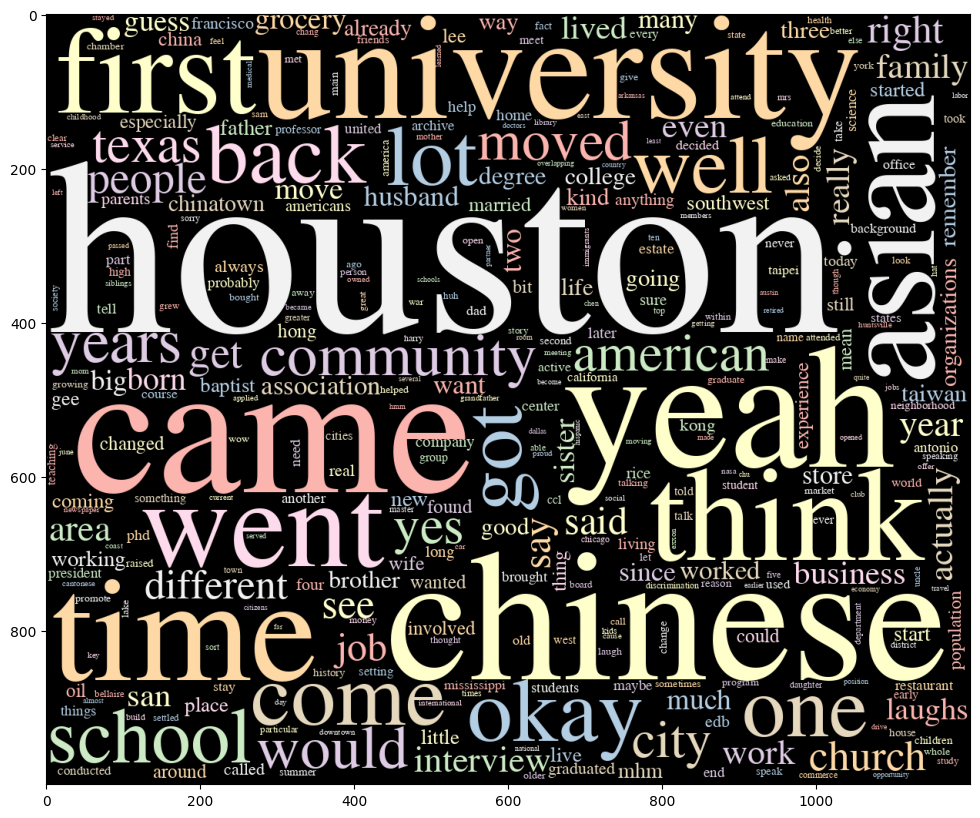

In [ ]:
wc_houston = WordCloud(font_path="timr45w.ttf", background_color="black", width = 1200, height = 1000, max_words=2000, min_font_size = 10, collocations=False, contour_width=3, colormap = 'Pastel1').generate_from_frequencies(filter_houston_collocate)
plt.axis("off")
    # so that the size shown matches our request
plt.figure(figsize=(12,10))
plt.tight_layout()
plt.imshow(wc_houston)

In [ ]:
wc_houston.to_file('chinese_houston_collate.png')

In [ ]:
# target_term = asia
asia_collocate, check_list4 = collocate_fre("asia", docs, filenames)
filter_asia_collocate = {k:v for k, v in asia_collocate.items() if k not in stop_list}

In [ ]:
count4 = 0
for inner_list in check_list4:
    for inner_inner_list in inner_list:
        count4 += 1
count4

33

In [ ]:
sorted_asia_count = sort_dict(filter_asia_collocate)
filename = "chinese_collocate_asia.csv"
col2csv(sorted_asia_count,filename)

Wrote the file chinese_collocate_asia.csv


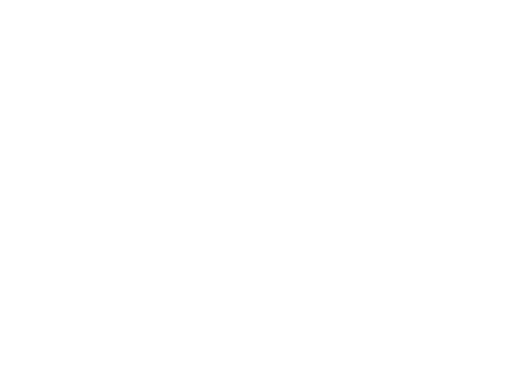

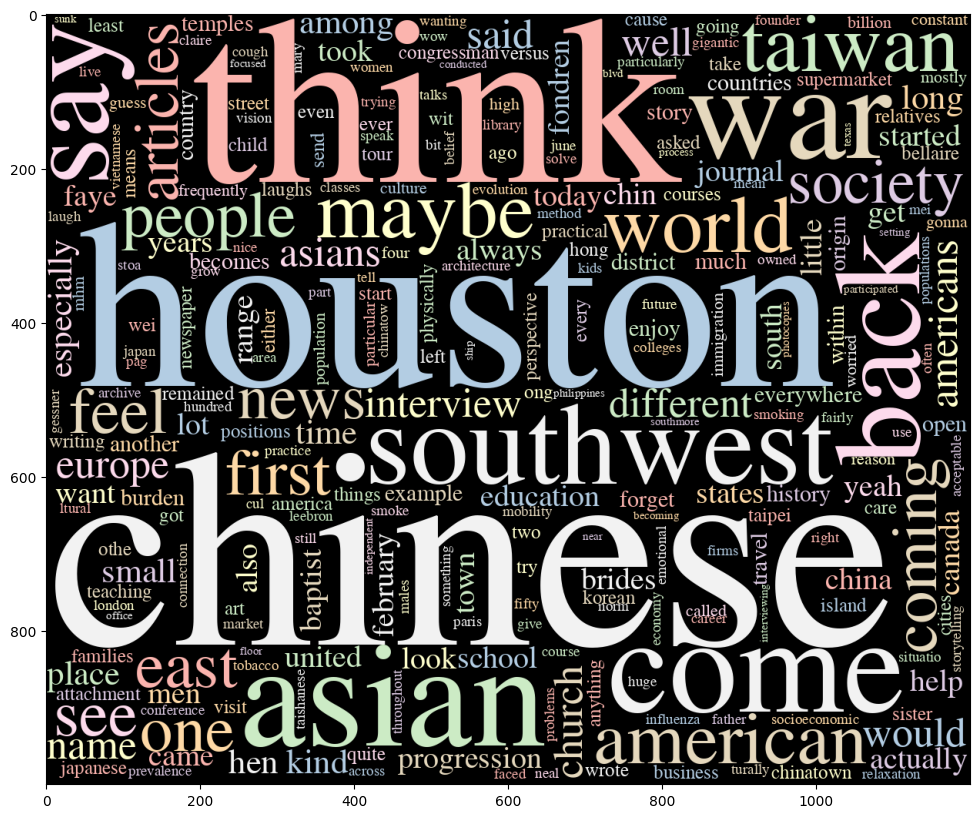

In [ ]:
wc_asia = WordCloud(font_path="timr45w.ttf", background_color="black", width = 1200, height = 1000, max_words=2000, min_font_size = 10, collocations=False, contour_width=3, colormap = 'Pastel1').generate_from_frequencies(filter_asia_collocate)
plt.axis("off")
    # so that the size shown matches our request
plt.figure(figsize=(12,10))
plt.tight_layout()
plt.imshow(wc_asia)

In [ ]:
wc_asia.to_file('chinese_asia_collate.png')

In [ ]:
# Would love to see what the war is and how?
war_list = []
for inner_list in check_list3:
  for inner_inner_list in inner_list:
    if 'war' in inner_inner_list:
      war_list.append(inner_inner_list)
#war_list
# war only appears in the context twice, but it's the smallness of data

In [ ]:
# target_term = america
america_collocate, check_list4 = collocate_fre("america", docs, filenames)
filter_america_collocate = {k:v for k, v in america_collocate.items() if k not in stop_list}

In [ ]:
sorted_america_count = sort_dict(filter_america_collocate)
filename = "chinese_collocate_america.csv"
col2csv(sorted_america_count,filename)

Wrote the file chinese_collocate_america.csv


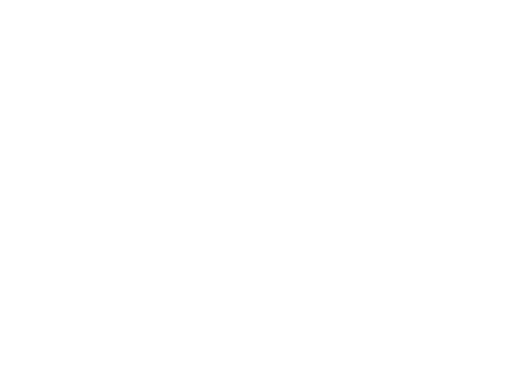

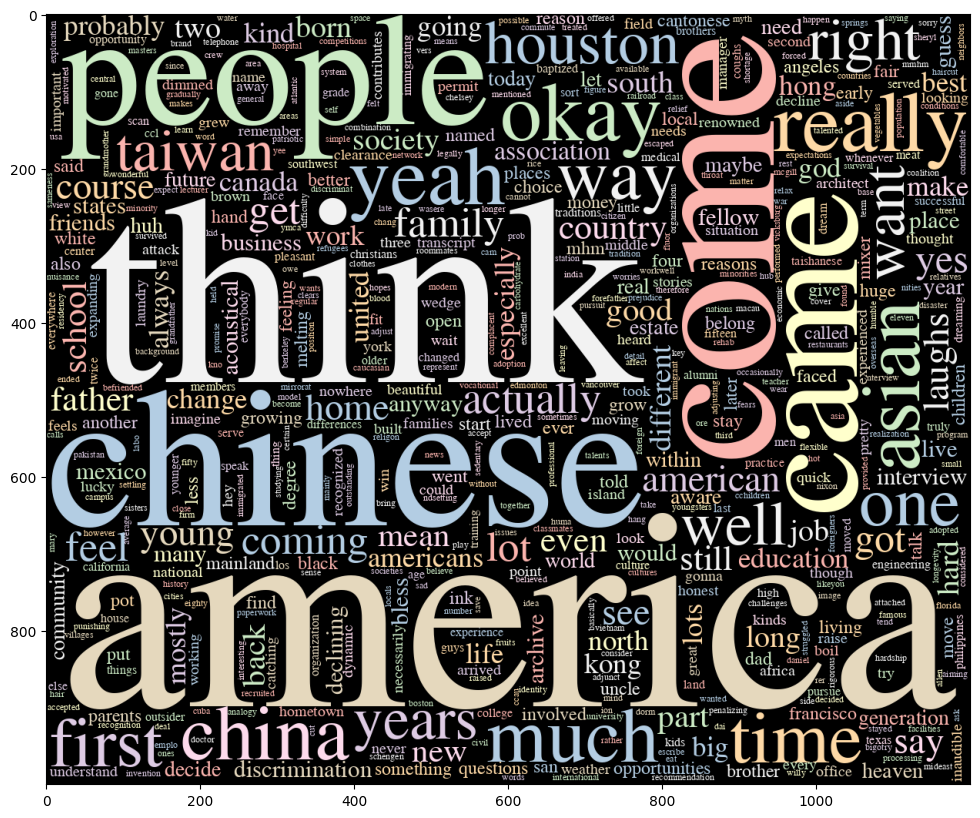

In [ ]:
wc_america = WordCloud(font_path="timr45w.ttf", background_color="black", width = 1200, height = 1000, max_words=2000, min_font_size = 10, collocations=False, contour_width=3, colormap = 'Pastel1').generate_from_frequencies(filter_america_collocate)
plt.axis("off")
    # so that the size shown matches our request
plt.figure(figsize=(12,10))
plt.tight_layout()
plt.imshow(wc_america)

In [ ]:
asia_collocate['war']

5

In [ ]:
wc_america.to_file('chinese_america_collate.png')

In [ ]:
# target_term = husband
husband_collocate, check_list5 = collocate_fre("husband", docs, filenames)
filter_husband_collocate = {k:v for k, v in husband_collocate.items() if k not in stop_list}

In [ ]:
count5 = 0
for inner_list in check_list5:
    for inner_inner_list in inner_list:
        count5 += 1
count5

233

In [ ]:
sorted_husband_count = sort_dict(filter_husband_collocate)
filename = "chinese_collocate_husband.csv"
col2csv(sorted_husband_count,filename)

Wrote the file chinese_collocate_husband.csv


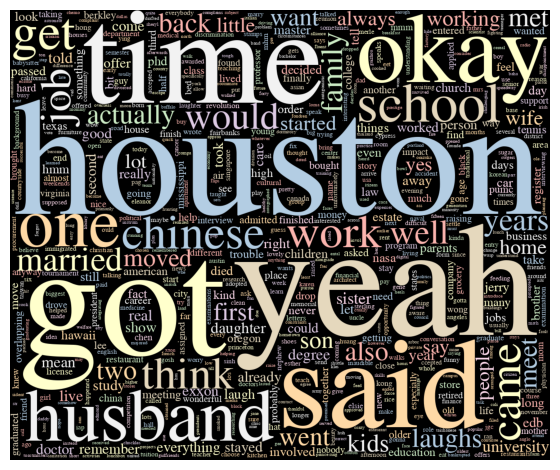

In [ ]:
wc_husband = WordCloud(font_path="timr45w.ttf", background_color="black", width = 1200, height = 1000, max_words=2000, min_font_size = 10, collocations=False, contour_width=3, colormap = 'Pastel1').generate_from_frequencies(filter_husband_collocate)
plt.axis("off")
    # so that the size shown matches our request
plt.tight_layout()
plt.imshow(wc_husband)

In [ ]:
wc_husband.to_file('chinese_husband_collate.png')

In [ ]:
# target_term = wife
wife_collocate, check_list6 = collocate_fre("wife", docs, filenames)
filter_wife_collocate = {k:v for k, v in wife_collocate.items() if k not in stop_list}

In [ ]:
sorted_wife_count = sort_dict(filter_wife_collocate)
filename = "chinese_collocate_wife.csv"
col2csv(sorted_wife_count,filename)

Wrote the file chinese_collocate_wife.csv


In [ ]:
count6 = 0
for inner_list in check_list6:
    for inner_inner_list in inner_list:
        count6 += 1
count6

256

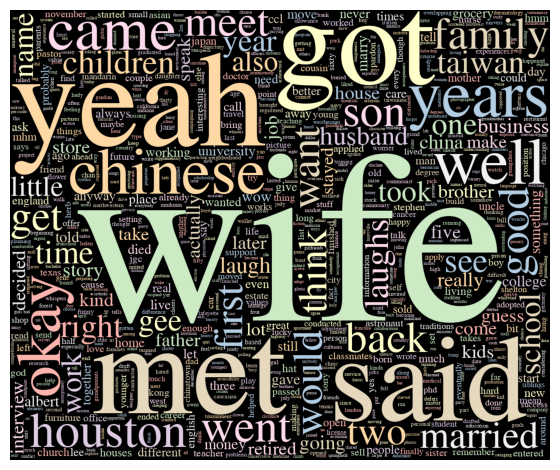

In [ ]:
wc_wife = WordCloud(font_path="timr45w.ttf", background_color="black", width = 1200, height = 1000, max_words=2000, min_font_size = 10, collocations=False, contour_width=3, colormap = 'Pastel1').generate_from_frequencies(filter_wife_collocate)
plt.axis("off")
    # so that the size shown matches our request
plt.tight_layout()
plt.imshow(wc_wife)

In [ ]:
# target_term = war
war_collocate, check_list6 = collocate_fre("war", docs, filenames)
filter_war_collocate = {k:v for k, v in war_collocate.items() if k not in stop_list}

In [ ]:
sorted_war_count = sort_dict(filter_war_collocate)
filename = "chinese_collocate_war.csv"
col2csv(sorted_war_count,filename)

Wrote the file chinese_collocate_war.csv


####Most Distinctive Collocates

In [ ]:
# define alpha
alpha = 0.05
# get full transcription
nested_list = docs['tokens'].tolist()
# flatten list
transcription = [word for sublist in nested_list for word in sublist]

In [ ]:
# get count dictionary
count_dict = Counter(transcription)
# get frequency dictionary
frequency_dict = freqdict(count_dict, transcription)

In [ ]:
def most_distinctive_collocate(fre_dict, kwic_counts):
  """
  input frequency dictionary and kwic_counts dict
  output most distinctive collocate dictionary
  """
  mdcs = {}
  for collocate in kwic_counts:
    p, oe = get_fishers(collocate, kwic_counts, fre_dict)
    if p < alpha:
        mdcs[collocate] = {'count': kwic_counts[collocate],
                          'p-value': p,
                          'obs/exp': oe}
  return mdcs

In [ ]:
mdcs_home = most_distinctive_collocate(frequency_dict, filter_home_collocate)

In [ ]:
def dict2csv(somedict, filename):
  """
  write out csv table
  """
  field_names = ['key', 'count', 'p-value', 'obs/exp']

  # Open the CSV file in write mode
  with open(filename, 'w', newline='') as f:
      writer = csv.DictWriter(f, fieldnames=field_names)

      # Write the header row
      writer.writeheader()

      # Write the data rows
      for key, values in somedict.items():
          row = {'key': key, 'count': values['count'], 'p-value': values['p-value'], 'obs/exp': values['obs/exp']}
          writer.writerow(row)

In [ ]:
filename = "chinese_mdcs_home.csv"
dict2csv(mdcs_home,filename)

In [ ]:
mdcs_home.keys()

dict_keys(['show', 'kids', 'husband', 'home', 'said', 'live', 'air', 'time', 'left', 'stayed', 'finish', 'leave', 'got', 'afternoon', 'took', 'hours', 'care', 'mom', 'job', 'years', 'came', 'lot', 'come', 'back', 'stay', 'house', 'economics', 'car', 'get', 'skills', 'food', 'would', 'okay', 'chinese', 'family', 'could', 'children', 'school', 'speak', 'street', 'lived', 'went', 'address', 'office', 'interview', 'decided', 'life', 'summer', 'working', 'told', 'miles', 'mother', 'day', 'language', 'really', 'away', 'walking', 'nanny', 'never', 'feel', 'america', 'feeling', 'dad', 'spoke', 'studied', 'conducted', 'patient', 'mandarin', 'staying', 'michael'])

In [ ]:
mdcs_china = most_distinctive_collocate(frequency_dict, filter_china_collocate)
mdcs_china.keys()

dict_keys(['right', 'cannot', 'actually', 'china', 'back', 'mom', 'mainland', 'family', 'country', 'lot', 'different', 'visit', 'taiwan', 'totally', 'years', 'mother', 'star', 'see', 'generation', 'came', 'father', 'parents', 'people', 'come', 'never', 'famous', 'married', 'chinese', 'still', 'even', 'born', 'went', 'yeah', 'side', 'dad', 'kind', 'communists', 'coming', 'hong', 'kong', 'first', 'ever', 'time', 'originally', 'united', 'states', 'moved', 'grew', 'university', 'japanese', 'war', 'lots', 'okay', 'track', 'background', 'long', 'childhood', 'took', 'old', 'many', 'also', 'part', 'since', 'national', 'left', 'stayed', 'village', 'harry', 'year', 'america', 'clears', 'trip', 'living', 'edb', 'prc', 'republic', 'difference', 'destroyed', 'canton', 'cultural', 'revolution', 'letter', 'kai', 'lee', 'washington', 'vietnam', 'compared', 'shanghai', 'northeast', 'teenager', 'province', 'stay', 'group', 'japan', 'places', 'guangzhou', 'several', 'communist', 'ther', 'course', 'almost

In [ ]:
filename = "chinese_mdcs_china.csv"
dict2csv(mdcs_china,filename)

In [ ]:
mdcs_houston = most_distinctive_collocate(frequency_dict, filter_houston_collocate)
mdcs_houston.keys()

dict_keys(['job', 'exxon', 'time', 'got', 'offer', 'real', 'estate', 'houston', 'husband', 'years', 'lot', 'community', 'chinese', 'yeah', 'come', 'california', 'get', 'lived', 'came', 'sure', 'think', 'top', 'see', 'moved', 'raised', 'college', 'active', 'asian', 'american', 'new', 'born', 'start', 'first', 'different', 'school', 'today', 'market', 'worked', 'since', 'yes', 'family', 'background', 'especially', 'four', 'town', 'place', 'well', 'found', 'university', 'texas', 'actually', 'city', 'science', 'three', 'association', 'interview', 'san', 'antonio', 'teaching', 'big', 'live', 'phd', 'organizations', 'area', 'history', 'center', 'bit', 'east', 'end', 'would', 'also', 'citizens', 'alliance', 'southwest', 'setting', 'labor', 'within', 'oral', 'office', 'june', 'conducted', 'neighborhood', 'one', 'okay', 'father', 'reason', 'sister', 'attended', 'involved', 'america', 'living', 'collapse', 'oil', 'lee', 'state', 'degree', 'currently', 'professor', 'decide', 'grandfather', 'build

In [ ]:
filename = "chinese_mdcs_houston.csv"
dict2csv(mdcs_houston,filename)

In [ ]:
mdcs_asia = most_distinctive_collocate(frequency_dict, filter_asia_collocate)
mdcs_asia.keys()

dict_keys(['houston', 'chinese', 'war'])

In [ ]:
filename = "chinese_mdcs_asia.csv"
dict2csv(mdcs_asia,filename)

In [ ]:
mdcs_america = most_distinctive_collocate(frequency_dict, filter_america_collocate)
mdcs_america.keys()

dict_keys(['think', 'country', 'chinese', 'way', 'taiwan', 'come', 'actually', 'south', 'houston', 'asian', 'people', 'came', 'young', 'china', 'feel', 'canada', 'family', 'yes', 'coming', 'home', 'much', 'america', 'first', 'society', 'really', 'course', 'association', 'north'])

In [ ]:
filename = "chinese_mdcs_america.csv"
dict2csv(mdcs_america,filename)

In [ ]:
mdcs_husband = most_distinctive_collocate(frequency_dict, filter_husband_collocate)
mdcs_husband.keys()

dict_keys(['exxon', 'kids', 'job', 'show', 'offer', 'two', 'home', 'houston', 'husband', 'daughter', 'years', 'yeah', 'got', 'said', 'work', 'doctor', 'one', 'moved', 'time', 'study', 'get', 'live', 'actually', 'school', 'came', 'son', 'trouble', 'also', 'told', 'master', 'married', 'met', 'degree', 'second', 'edb', 'nasa', 'okay', 'person', 'working', 'stayed', 'meet', 'wife', 'family', 'meeting', 'real', 'started', 'university', 'oregon', 'sister', 'register', 'tennis', 'hawaii', 'jerry'])

In [ ]:
filename = "chinese_mdcs_husband.csv"
dict2csv(mdcs_husband,filename)

In [ ]:
mdcs_wife = most_distinctive_collocate(frequency_dict, filter_wife_collocate)
mdcs_wife.keys()

dict_keys(['chinese', 'married', 'move', 'house', 'man', 'children', 'said', 'years', 'okay', 'wife', 'came', 'five', 'year', 'went', 'back', 'two', 'took', 'retired', 'died', 'stayed', 'later', 'gee', 'son', 'met', 'england', 'name', 'anyway', 'albert', 'decided', 'interview', 'well', 'family', 'husband', 'got', 'want', 'good', 'gave', 'meet', 'taiwan', 'marry', 'houston', 'first', 'laugh', 'houses', 'story', 'japan'])

In [ ]:
filename = "chinese_mdcs_wife.csv"
dict2csv(mdcs_wife,filename)

In [ ]:
mdcs_war = most_distinctive_collocate(frequency_dict, filter_war_collocate)
mdcs_war.keys()

dict_keys(['time', 'back', 'china', 'japanese', 'went', 'vietnam', 'see', 'chinese', 'pearl', 'harbor', 'world', 'got', 'war', 'came', 'since', 'drafted', 'left', 'old', 'year', 'ended', 'japan', 'last', 'family', 'edb', 'even', 'yeah', 'though', 'civil', 'right', 'born', 'started', 'shanghai', 'korean', 'spanish', 'dad', 'served', 'broke', 'father', 'cook', 'brother', 'gis', 'american', 'taishanese', 'speak', 'asia', 'serve', 'nanking', 'memories', 'bride', 'brides', 'influenced'])

In [ ]:
filename = "chinese_mdcs_war.csv"
dict2csv(mdcs_war,filename)

#### Most Frequent Words

In [ ]:
# ---Two ways to do that---

In [ ]:
# sort the dictionary into list
sorted_frequency_dict = sort_dict(frequency_dict)

In [ ]:
sorted_count_dict = sort_dict(count_dict)

In [ ]:
sorted_count_dict[:50]

[('the', 19432),
 ('and', 17533),
 ('you', 15304),
 ('that', 10883),
 ('was', 7358),
 ('they', 6252),
 ('know', 5825),
 ('but', 4131),
 ('have', 4041),
 ('like', 3688),
 ('for', 3560),
 ('then', 3170),
 ('there', 3032),
 ('yeah', 2990),
 ('when', 2669),
 ('what', 2509),
 ('because', 2507),
 ('were', 2495),
 ('not', 2484),
 ('think', 2463),
 ('just', 2459),
 ('all', 2452),
 ('with', 2364),
 ('your', 2244),
 ('time', 2237),
 ('did', 2226),
 ('chinese', 2202),
 ('she', 2165),
 ('don', 2044),
 ('okay', 2019),
 ('had', 2016),
 ('are', 1985),
 ('this', 1978),
 ('very', 1958),
 ('from', 1952),
 ('one', 1931),
 ('people', 1898),
 ('about', 1748),
 ('can', 1704),
 ('how', 1678),
 ('school', 1595),
 ('would', 1559),
 ('get', 1502),
 ('said', 1493),
 ('well', 1469),
 ('here', 1457),
 ('them', 1441),
 ('lot', 1400),
 ('went', 1305),
 ('got', 1302)]

In [ ]:
# find the keys for the fifty highest items
fifty_highest_values = heapq.nlargest(50, frequency_dict, key=frequency_dict.get)

## Most Distinctive Words among individual transcripts

In [ ]:
def mdw(min_docs, filenames, corpus_count_dict, cull_count_dict, output_table, freq_dict):
  """
  input min_docs(int), filenames(list), output_table(list)
  output a new output_table in csv format in list
  """
  output = output_table.copy()
  true_cull = min(min_docs,len(filenames))

  print('Calculating significance...')
  for corpus,data in corpus_count_dict.items():
    print(f'Working on the {corpus} corpus...')
    for w,c in data.items():
      if c < cutoff:
        continue
      if cull_count_dict[w] < true_cull:
        continue
      if exclude_stops:
        if w in stop_list:
          continue
      p,oe = get_fishers(w,data,freq_dict)
      if p < alpha:
        output.append([corpus,w,c,p,oe])
  print('Complete!')
  return output

In [ ]:
cutoff = 25
alpha = .05
exclude_stops = True
min_docs = 2

output_table = [['corpus','token_','count','p_value','obs/exp']]

In [ ]:
# total frequency_dict
# frequency_dict

# get counts for each corpus

# change df into dictionary of (id: string)
chinese_corpus_dict = docs['tokens'].to_dict()

# find the total word count for corpus_dict
chinese_corpus_count_dict = {}
# find how many documents a word appear in
chinese_cull_counts = {}
for key, corpus in chinese_corpus_dict.items():
  chinese_corpus_count_dict[key] = Counter(corpus)
  for word in set(corpus):
    if word not in chinese_cull_counts:
      chinese_cull_counts[word] = 0
    chinese_cull_counts[word] += 1

In [ ]:
# find words that appear in all interviews
common_words = []
for key, corpus in chinese_cull_counts.items():
  if corpus == 50:
    common_words.append(key)
# common_words

In [ ]:
new_output_table = mdw(min_docs, filenames, chinese_corpus_count_dict, chinese_cull_counts, output_table)

Calculating significance...
Working on the Gene Chung.pdf corpus...
Working on the Willy Lo.pdf corpus...
Working on the Edmond Gor.pdf corpus...
Working on the Shane Chen.pdf corpus...
Working on the Jackson Chang.pdf corpus...
Working on the Teh Cheong Chang.pdf corpus...
Working on the Tommy Ligh.pdf corpus...
Working on the Lawrence Chan.pdf corpus...
Working on the Paul Chu.pdf corpus...
Working on the Raymond Gee.pdf corpus...
Working on the Elsie Huang.pdf corpus...
Working on the Annie Chen.pdf corpus...
Working on the Shelton Gee.pdf corpus...
Working on the Eleanor der Bing.pdf corpus...
Working on the Angela Cheng.pdf corpus...
Working on the Wei-Gwo Chen.pdf corpus...
Working on the Leroy Chiao.pdf corpus...
Working on the Beverly Gor.pdf corpus...
Working on the Rogene-transcript-rev.pdf corpus...
Working on the Theresa Chang.pdf corpus...
Working on the Jane Gee.pdf corpus...
Working on the Faye Chin 2.pdf corpus...
Working on the Chimei Lin.pdf corpus...
Working on the C

In [ ]:
# write out output table
# Specify the directory where you want the results

# Specify a filename for the results
output_filename = "chinese_mdw.csv"

lol2file(output_table,output_filename)

Wrote the file chinese_mdw.csv


# Indian Americans
## Basically the same procedure as the section in Chinese Americans

In [ ]:
def load_doc_indian(filename):
    doc = get_transcription("./Indian/" + filename).split("\n")
    return {'doc': doc,
            'tokens': tokenize(doc),
            'id': filename}

In [ ]:
filenames_indian = [file for file in os.listdir("./Indian") if file.endswith("pdf")]

In [ ]:
docs_indian = pd.DataFrame(list(map(load_doc_indian, filenames_indian))).set_index(['id'])
docs_indian.head()

,doc,tokens
id,,
Vibhuti Shah.pdf,"[Houston Asian American Archive , Chao Center...","[vibhuti, shah, saniya, gayake, taylor, ginter..."
Vispi Sagar.pdf,"[Houston Asian American Archive , Chao Center ...","[vispi, rustom, sagar, chris, johnson, junior,..."
Anita Jaisinghani.pdf,"[ , , , , , , , , , , , , , , ...","[anita, jaisinghani, tian, tian, date, intervi..."
Nibu Abraham.pdf,"[ Houston Asian American Archive (HAAA) , Chao...","[nibu, abraham, kevin, chen, date, interview, ..."
Ms. Pavri.pdf,"[Houston Asian American Archive , Chao Center ...","[yasmin, pavri, rachel, wong, senior, linda, h..."


##Collocates_indian

In [ ]:
# target_term = home
home_collocate_indian, check_list_indian1 = collocate_fre("home", docs_indian, filenames_indian)
filter_home_collocate_indian = {k:v for k, v in home_collocate_indian.items() if k not in stop_list}

NameError: ignored

In [ ]:
sorted_indian_home_count = sort_dict(filter_home_collocate_indian)
filename = "indian_collocate_home.csv"
col2csv(sorted_indian_home_count,filename)

Wrote the file indian_collocate_home.csv


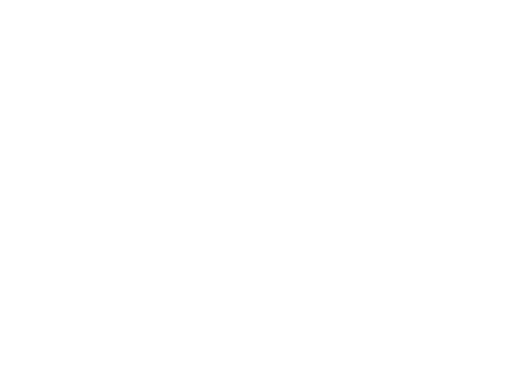

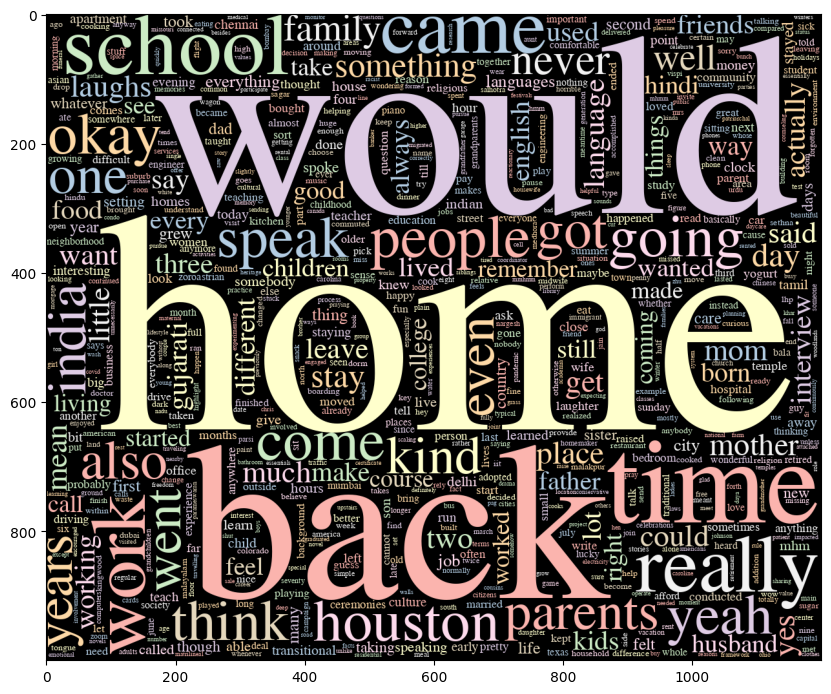

In [ ]:
wc_home_indian = WordCloud(font_path="timr45w.ttf", background_color="black", width = 1200, height = 1000, max_words=2000, min_font_size = 10, collocations=False, contour_width=3, colormap = 'Pastel1').generate_from_frequencies(filter_home_collocate_indian)
plt.axis("off")
    # so that the size shown matches our request
plt.figure(figsize=(10,10))
plt.tight_layout()
plt.imshow(wc_home_indian)

In [ ]:
wc_home_indian.to_file('indian_home_collate.png')

In [ ]:
# target_term = india
india_collocate_indian, check_list_indian2 = collocate_fre("india", docs_indian, filenames_indian)
filter_india_collocate_indian = {k:v for k, v in india_collocate_indian.items() if k not in stop_list}

In [ ]:
count_indian2 = 0
for inner_list in check_list_indian2:
    for inner_inner_list in inner_list:
        count_indian2 += 1
count_indian2

1451

In [ ]:
sorted_indian_india_count = sort_dict(filter_india_collocate_indian)
filename = "indian_collocate_india.csv"
col2csv(sorted_indian_india_count,filename)

Wrote the file indian_collocate_india.csv


In [ ]:
filter_india_collocate_indian['india']

376

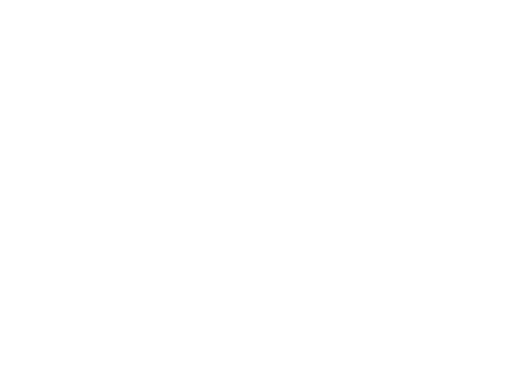

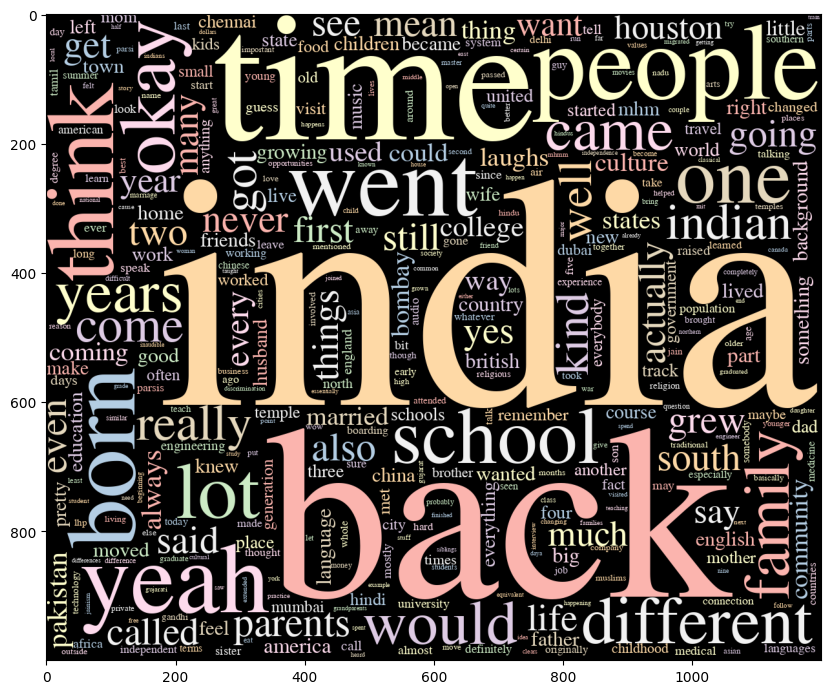

In [ ]:
wc_india_indian = WordCloud(font_path="timr45w.ttf", background_color="black", width = 1200, height = 1000, max_words=2000, min_font_size = 10, collocations=False, contour_width=3, colormap = 'Pastel1').generate_from_frequencies(filter_india_collocate_indian)
plt.axis("off")
    # so that the size shown matches our request
plt.figure(figsize=(10,10))
plt.tight_layout()
plt.imshow(wc_india_indian)

In [ ]:
wc_india_indian.to_file('indian_india_collate.png')

In [ ]:
# target_term = houston
houston_collocate_indian, check_list_indian3 = collocate_fre("houston", docs_indian, filenames_indian)
filter_houston_collocate_indian = {k:v for k, v in houston_collocate_indian.items() if k not in stop_list}

In [ ]:
sorted_indian_houston_count = sort_dict(filter_houston_collocate_indian)
filename = "indian_collocate_houston.csv"
col2csv(sorted_indian_houston_count,filename)

Wrote the file indian_collocate_houston.csv


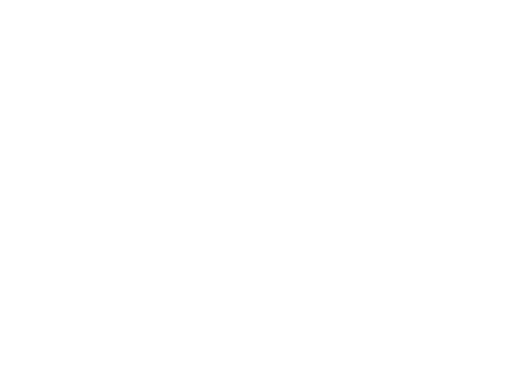

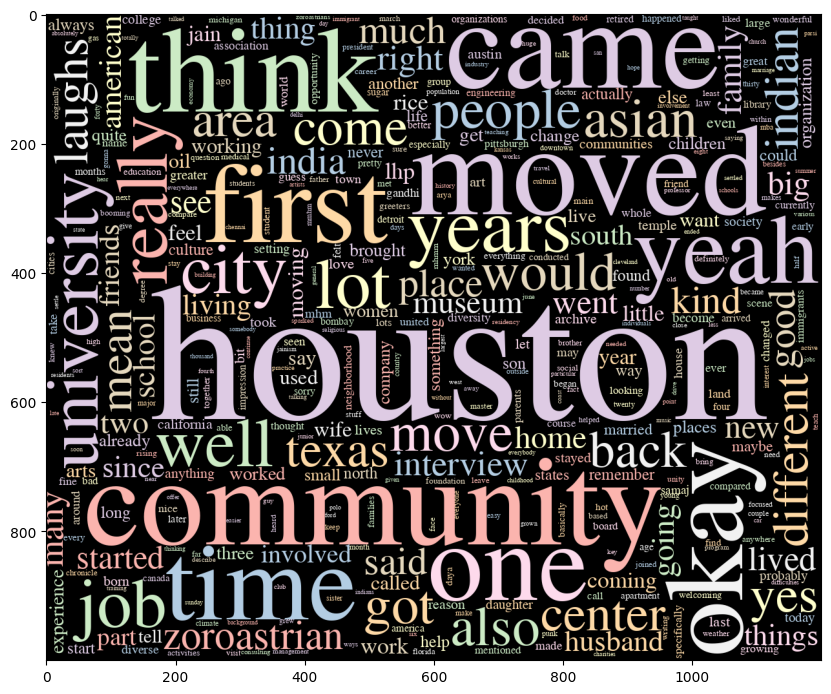

In [ ]:
wc_houston_indian = WordCloud(font_path="timr45w.ttf", background_color="black", width = 1200, height = 1000, max_words=2000, min_font_size = 10, collocations=False, contour_width=3, colormap = 'Pastel1').generate_from_frequencies(filter_houston_collocate_indian)
plt.axis("off")
    # so that the size shown matches our request
plt.figure(figsize=(10,10))
plt.tight_layout()
plt.imshow(wc_houston_indian)

In [ ]:
wc_houston_indian.to_file('indian_houston_collate.png')

In [ ]:
#target_term = asia
asia_collocate_indian, check_list_indian3 = collocate_fre("asia", docs_indian, filenames_indian)
filter_asia_collocate_indian = {k:v for k, v in asia_collocate_indian.items() if k not in stop_list}

In [ ]:
sorted_indian_asia_count = sort_dict(filter_asia_collocate_indian)
filename = "indian_collocate_asia.csv"
col2csv(sorted_indian_asia_count,filename)

Wrote the file indian_collocate_asia.csv


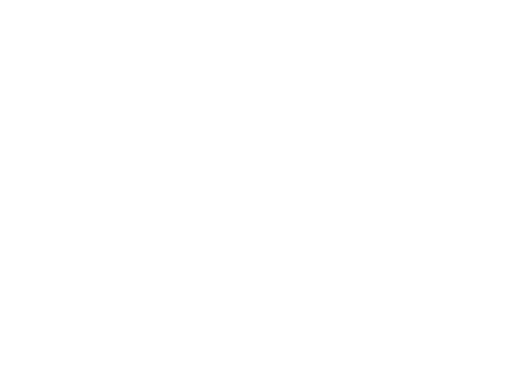

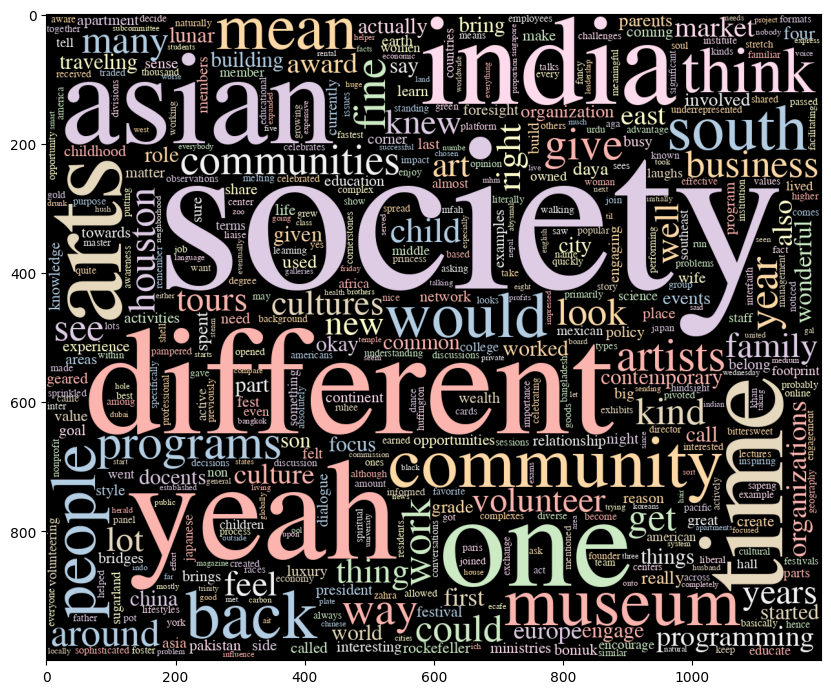

In [ ]:
wc_asia_indian = WordCloud(font_path="timr45w.ttf", background_color="black", width = 1200, height = 1000, max_words=2000, min_font_size = 10, collocations=False, contour_width=3, colormap = 'Pastel1').generate_from_frequencies(filter_asia_collocate_indian)
plt.axis("off")
    # so that the size shown matches our request
plt.figure(figsize=(10,10))
plt.tight_layout()
plt.imshow(wc_asia_indian)

In [ ]:
wc_asia_indian.to_file('indian_asia_collate.png')

In [ ]:
#target_term = america
america_collocate_indian, check_list_indian3 = collocate_fre("america", docs_indian, filenames_indian)
filter_america_collocate_indian = {k:v for k, v in america_collocate_indian.items() if k not in stop_list}

In [ ]:
sorted_indian_america_count = sort_dict(filter_america_collocate_indian)
filename = "indian_collocate_america.csv"
col2csv(sorted_indian_america_count,filename)

Wrote the file indian_collocate_america.csv


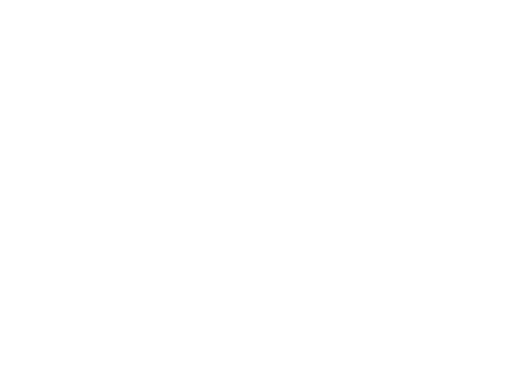

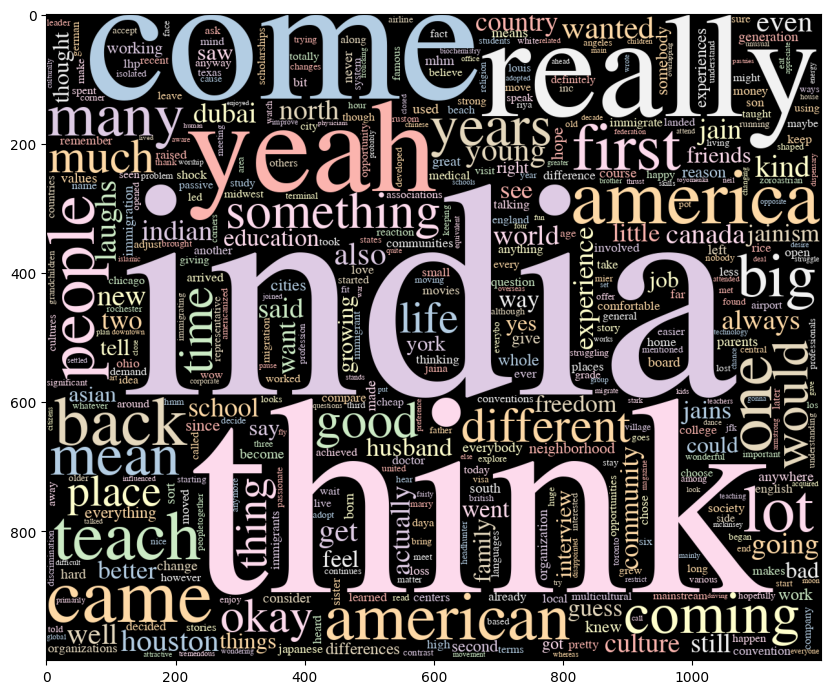

In [ ]:
wc_america_indian = WordCloud(font_path="timr45w.ttf", background_color="black", width = 1200, height = 1000, max_words=2000, min_font_size = 10, collocations=False, contour_width=3, colormap = 'Pastel1').generate_from_frequencies(filter_america_collocate_indian)
plt.axis("off")
    # so that the size shown matches our request
plt.figure(figsize=(10,10))
plt.tight_layout()
plt.imshow(wc_america_indian)

In [ ]:
wc_america_indian.to_file('indian_america_collate.png')

In [ ]:
#target_term = husband
husband_collocate_indian, check_list_indian5 = collocate_fre("husband", docs_indian, filenames_indian)
filter_husband_collocate_indian = {k:v for k, v in husband_collocate_indian.items() if k not in stop_list}

In [ ]:
sorted_indian_husband_count = sort_dict(filter_husband_collocate_indian)
filename = "indian_collocate_husband.csv"
col2csv(sorted_indian_husband_count,filename)

Wrote the file indian_collocate_husband.csv


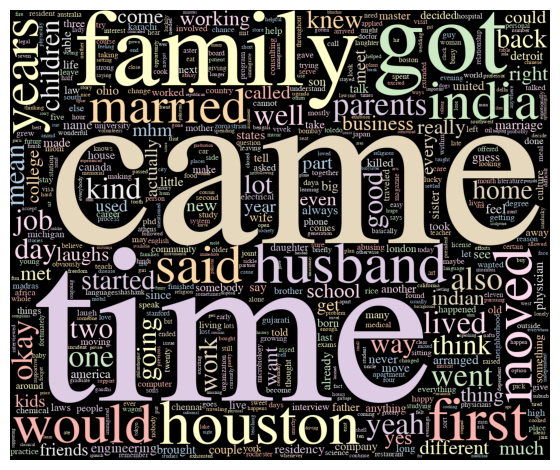

In [ ]:
wc_husband_indian = WordCloud(font_path="timr45w.ttf", background_color="black", width = 1200, height = 1000, max_words=2000, min_font_size = 10, collocations=False, contour_width=3, colormap = 'Pastel1').generate_from_frequencies(filter_husband_collocate_indian)
plt.axis("off")
    # so that the size shown matches our request
plt.tight_layout()
plt.imshow(wc_husband_indian)

In [ ]:
#target_term = wife
wife_collocate_indian, check_list_indian5 = collocate_fre("wife", docs_indian, filenames_indian)
filter_wife_collocate_indian = {k:v for k, v in wife_collocate_indian.items() if k not in stop_list}

In [ ]:
sorted_indian_wife_count = sort_dict(filter_wife_collocate_indian)
filename = "indian_collocate_wife.csv"
col2csv(sorted_indian_wife_count,filename)

Wrote the file indian_collocate_wife.csv


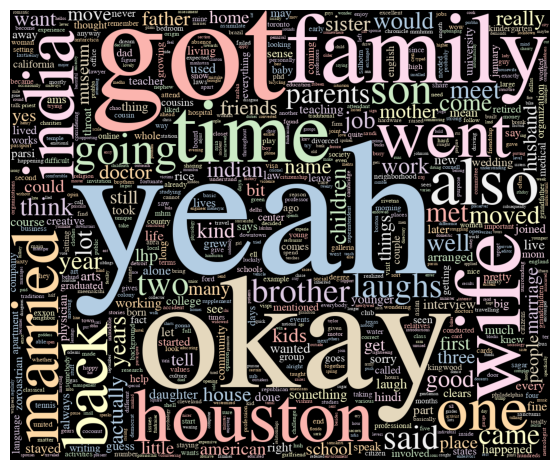

In [ ]:
wc_wife_indian = WordCloud(font_path="timr45w.ttf", background_color="black", width = 1200, height = 1000, max_words=2000, min_font_size = 10, collocations=False, contour_width=3, colormap = 'Pastel1').generate_from_frequencies(filter_wife_collocate_indian)
plt.axis("off")
    # so that the size shown matches our request
plt.tight_layout()
plt.imshow(wc_wife_indian)

In [ ]:
# why india and think?

In [ ]:
#target_term = married
married_collocate_indian, check_list_indian5 = collocate_fre("married", docs_indian, filenames_indian)
filter_married_collocate_indian = {k:v for k, v in married_collocate_indian.items() if k not in stop_list}

##Most Distinctive Collocates

In [ ]:
# define alpha
alpha = 0.05
# get full transcription
indian_list = docs_indian['tokens'].tolist()
# flatten list
transcription_indian = [word for sublist in indian_list for word in sublist]

In [ ]:
# get count dictionary
count_dict_indian = Counter(transcription_indian)
# get frequency dictionary
frequency_dict_indian = freqdict(count_dict_indian, transcription_indian)

In [ ]:
frequency_dict['husband']

0.0005817190421858654

In [ ]:
frequency_dict_indian['wife']

0.0006484083119770278

In [ ]:
mdcs_home_indian = most_distinctive_collocate(frequency_dict_indian, filter_home_collocate_indian)
mdcs_home_indian.keys()

NameError: ignored

In [ ]:
filename = "indian_mdcs_home.csv"
dict2csv(mdcs_home_indian,filename)

In [ ]:
mdcs_india_indian = most_distinctive_collocate(frequency_dict_indian, filter_india_collocate_indian)
mdcs_india_indian.keys()

dict_keys(['people', 'childhood', 'yeah', 'india', 'grew', 'south', 'okay', 'still', 'every', 'year', 'time', 'tamil', 'language', 'states', 'one', 'lot', 'many', 'speak', 'summer', 'born', 'nadu', 'husband', 'state', 'called', 'independent', 'north', 'english', 'back', 'early', 'coming', 'ever', 'always', 'visited', 'part', 'could', 'track', 'background', 'first', 'came', 'united', 'parts', 'kind', 'thing', 'come', 'old', 'became', 'independence', 'town', 'muslims', 'hindus', 'married', 'well', 'college', 'wanted', 'education', 'two', 'schools', 'languages', 'also', 'even', 'pakistan', 'indian', 'train', 'migrated', 'life', 'see', 'family', 'went', 'got', 'course', 'different', 'mean', 'changing', 'travel', 'way', 'fact', 'bombay', 'air', 'going', 'mother', 'england', 'wow', 'school', 'equivalent', 'terms', 'culture', 'system', 'think', 'actually', 'everything', 'countries', 'audio', 'attended', 'degree', 'wealthy', 'used', 'british', 'hindi', 'war', 'knew', 'really', 'parents', 'live

In [ ]:
filename = "indian_mdcs_india.csv"
dict2csv(mdcs_india_indian,filename)

In [ ]:
mdcs_houston_indian = most_distinctive_collocate(frequency_dict_indian, filter_houston_collocate_indian)
mdcs_houston_indian.keys()

dict_keys(['moved', 'family', 'diverse', 'fourth', 'largest', 'michigan', 'diversity', 'also', 'chronicle', 'houston', 'living', 'thirty', 'years', 'center', 'south', 'asian', 'based', 'neighborhoods', 'city', 'yeah', 'big', 'population', 'oil', 'boom', 'weather', 'university', 'first', 'job', 'association', 'texas', 'community', 'activities', 'help', 'indian', 'american', 'organization', 'interview', 'reason', 'came', 'moving', 'lot', 'west', 'places', 'good', 'started', 'early', 'worked', 'okay', 'long', 'time', 'think', 'united', 'states', 'florida', 'one', 'well', 'back', 'consulting', 'company', 'yes', 'wife', 'originally', 'lives', 'today', 'brought', 'start', 'live', 'got', 'decided', 'move', 'lived', 'ago', 'really', 'zoroastrian', 'lots', 'place', 'lhp', 'coming', 'bad', 'focused', 'feel', 'welcoming', 'love', 'area', 'laughs', 'experience', 'took', 'face', 'wonderful', 'large', 'right', 'since', 'seen', 'change', 'tell', 'downtown', 'part', 'austin', 'coast', 'come', 'home', 

In [ ]:
filename = "indian_mdcs_houston.csv"
dict2csv(mdcs_houston_indian,filename)

In [ ]:
mdcs_asia_indian = most_distinctive_collocate(frequency_dict_indian, filter_asia_collocate_indian)
mdcs_asia_indian.keys()

dict_keys(['india', 'society', 'museum', 'fine', 'arts', 'yeah', 'south', 'asian', 'one', 'different', 'community', 'programs', 'communities', 'artists'])

In [ ]:
filename = "indian_mdcs_asia.csv"
dict2csv(mdcs_asia_indian,filename)

In [ ]:
mdcs_america_indian = most_distinctive_collocate(frequency_dict_indian, filter_america_collocate_indian)
mdcs_america_indian.keys()

dict_keys(['husband', 'back', 'experience', 'really', 'think', 'america', 'come', 'wanted', 'much', 'yeah', 'american', 'came', 'big', 'india', 'north', 'new', 'canada', 'coming', 'thing', 'jain', 'jainism', 'young', 'jains', 'culture', 'different', 'something', 'first', 'teach', 'better', 'saw', 'bad', 'mean', 'anywhere', 'immigration', 'place', 'good', 'lot', 'many', 'freedom', 'world', 'consider', 'life', 'cities', 'country', 'differences', 'dubai'])

In [ ]:
filename = "indian_mdcs_america.csv"
dict2csv(mdcs_america_indian,filename)

In [ ]:
mdcs_husband_indian = most_distinctive_collocate(frequency_dict_indian, filter_husband_collocate_indian)
mdcs_husband_indian.keys()

dict_keys(['time', 'right', 'came', 'detroit', 'said', 'started', 'home', 'residency', 'also', 'knew', 'working', 'indian', 'india', 'first', 'married', 'london', 'america', 'way', 'well', 'madras', 'mean', 'every', 'thing', 'college', 'moved', 'killed', 'united', 'states', 'physician', 'meet', 'part', 'already', 'work', 'new', 'job', 'lived', 'yes', 'went', 'wife', 'master', 'years', 'kids', 'kind', 'got', 'parents', 'two', 'husband', 'called', 'traveled', 'move', 'couple', 'day', 'family', 'canada', 'arranged', 'marriage', 'son', 'good', 'abusing', 'houston', 'met', 'laws', 'able', 'brought', 'used', 'children', 'ohio', 'chemical', 'engineering', 'name', 'since', 'mhm', 'business', 'decided', 'sister', 'actually', 'consulting', 'karachi', 'electrical', 'computer'])

In [ ]:
filename = "indian_mdcs_husband.csv"
dict2csv(mdcs_husband_indian,filename)

In [ ]:
mdcs_wife_indian = most_distinctive_collocate(frequency_dict_indian, filter_wife_collocate_indian)
mdcs_wife_indian.keys()

dict_keys(['doctor', 'wife', 'back', 'time', 'husband', 'got', 'going', 'mother', 'laughs', 'yeah', 'married', 'met', 'okay', 'two', 'houston', 'stayed', 'children', 'actually', 'move', 'well', 'moved', 'clears', 'throat', 'india', 'said', 'lhp', 'job', 'father', 'family', 'creative', 'also', 'brother', 'kids', 'parents', 'come', 'name', 'came', 'laugh', 'marriage', 'indian', 'son', 'house', 'meet', 'wedding', 'went', 'arts', 'museum', 'year', 'sister', 'daughter', 'alone', 'physician'])

In [ ]:
filename = "indian_mdcs_wife.csv"
dict2csv(mdcs_wife_indian,filename)

In [ ]:
mdcs_married_indian = most_distinctive_collocate(frequency_dict_indian, filter_married_collocate_indian)
mdcs_married_indian.keys()

dict_keys(['years', 'came', 'woman', 'married', 'got', 'time', 'little', 'back', 'brother', 'college', 'okay', 'yes', 'husband', 'two', 'also', 'one', 'want', 'moved', 'stayed', 'never', 'states', 'india', 'parents', 'old', 'children', 'mom', 'getting', 'father', 'lived', 'family', 'couple', 'laughs', 'canada', 'wanted', 'get', 'parsi', 'muslim', 'bengali', 'guy', 'girl', 'hindu', 'cousins', 'said', 'son', 'born', 'later', 'ohio', 'wife', 'cousin', 'yet', 'come', 'age', 'yeah', 'master', 'months', 'zoroastrian', 'mother', 'second', 'first', 'january', 'december', 'knew', 'wedding', 'year', 'met', 'arranged', 'marriage', 'kids', 'houston', 'engaged', 'dad', 'already', 'went', 'younger', 'live', 'daughter', 'ago', 'non', 'karachi'])

##Most Frequent Words

In [ ]:
sorted_frequency_dict = sort_dict(frequency_dict_indian)

In [ ]:
count_dict['dance']

16

In [ ]:
count_dict_indian['dance']

99

## Most Distinctive Words Among Corpus

In [ ]:
# total frequency_dict
# frequency_dict

# get counts for each corpus

# change df into dictionary of (id: string)
indian_corpus_dict = docs_indian['tokens'].to_dict()

# find the total word count for corpus_dict
indian_corpus_count_dict = {}
# find how many documents a word appear in
indian_cull_counts = {}
for key, corpus in indian_corpus_dict.items():
  indian_corpus_count_dict[key] = Counter(corpus)
  for word in set(corpus):
    if word not in indian_cull_counts:
      indian_cull_counts[word] = 0
    indian_cull_counts[word] += 1

In [ ]:
# find words that appear in all interviews
indian_common_words = []
for key, corpus in indian_cull_counts.items():
  if corpus == 50:
    indian_common_words.append(key)
# common_words

In [ ]:
indian_output_table = mdw(min_docs, filenames_indian, indian_corpus_count_dict, indian_cull_counts, output_table, frequency_dict_indian)

Calculating significance...
Working on the JIMMY KUMANA.pdf corpus...
Working on the SHAPUR PAVRI.pdf corpus...
Working on the Chelsea de Souza.pdf corpus...
Working on the Raj Salhotra.pdf corpus...
Working on the Rajeev Raghavan.pdf corpus...
Working on the Betty Joseph.pdf corpus...
Working on the Prabha Bala.pdf corpus...
Working on the Percy Master.pdf corpus...
Working on the Lalitha Raman.pdf corpus...
Working on the Medha K. Karve.pdf corpus...
Working on the Dinesh Singhal.pdf corpus...
Working on the Vipul Mankad.pdf corpus...
Working on the Kalyani Giri.pdf corpus...
Working on the Viji Raman.pdf corpus...
Working on the Chitra Divakaruni.pdf corpus...
Working on the Riya Mehta.pdf corpus...
Working on the Rathna Kumar.pdf corpus...
Working on the NOSHIR MEDHORA.pdf corpus...
Working on the Saleena Jafry.pdf corpus...
Working on the Vispi Sagar.pdf corpus...
Working on the Sushila Agrawal.pdf corpus...
Working on the Meheryar Rivetna .pdf corpus...
Working on the Devinder Ma

In [ ]:
# indian_true_cull = min(min_docs,len(filenames_indian))
# indian_output = output_table.copy()
# print('Calculating significance...')
# for corpus,data in indian_corpus_count_dict.items():
#   print(f'Working on the {corpus} corpus...')
#   for w,c in data.items():
#     if c < cutoff:
#       continue
#     if indian_cull_counts[w] < indian_true_cull:
#       continue
#     if exclude_stops:
#       if w in stop_list:
#         continue
#     p,oe = get_fishers(w,data,frequency_dict_indian)
#     if p < alpha:
#       indian_output.append([corpus,w,c,p,oe])
# print('Complete!')

In [ ]:
# write out output table
# Specify the directory where you want the results

# Specify a filename for the results
indian_output_filename = "indian_mdw.csv"

lol2file(indian_output_table,indian_output_filename)

Wrote the file indian_mdw.csv


# Most Distinctive Words between Chinese and Indian Americans

In [ ]:
cutoff = 25
alpha = .05
exclude_stops = True
min_docs = 1
filenames_chinese_indian = ['chinese', 'indian']

output_table = [['corpus','token_','count','p_value','obs/exp']]

In [ ]:
# get full_transcription
chinese_indian_trancript = transcription + transcription_indian

In [ ]:
# get count dictionary
count_dict_chinese_indian = Counter(chinese_indian_trancript)
# get frequency dictionary
frequency_dict_chinese_indian = freqdict(count_dict_chinese_indian, chinese_indian_trancript)

In [ ]:
# find counts for each corpus
chinese_indian_corpus_dict = {'chinese': count_dict, 'indian': count_dict_indian}
# find freq for each corpus
chinese_indian_freq_dict = {'chinese': frequency_dict, 'indian': frequency_dict_indian}

###Most Frequent Words

In [ ]:
sorted_chinese_indian_frequency_dict = sort_dict(count_dict_chinese_indian)

In [ ]:
# find how many documents a word appear in
chinese_indian_cull_counts = {}
for key, corpus in chinese_indian_corpus_dict.items():
  for word in set(corpus):
    if word not in chinese_indian_cull_counts:
      chinese_indian_cull_counts[word] = 0
    chinese_indian_cull_counts[word] += 1

In [ ]:
chinese_indian_output_table = mdw(min_docs, filenames_indian, chinese_indian_corpus_dict, chinese_indian_cull_counts, output_table, frequency_dict_chinese_indian)

Calculating significance...
Working on the chinese corpus...
Working on the indian corpus...
Complete!


In [ ]:
# write out output table
# Specify the directory where you want the results

# Specify a filename for the results
chinese_indian_output_filename = "chinese_indian_mdw.csv"

lol2file(chinese_indian_output_table,chinese_indian_output_filename)

Wrote the file chinese_indian_mdw.csv
